# Fine Clustering

Inspired by the Transient analysis, the idea here is to first cluster cells into a large number of small clusters with ~1000 cells each, and then cluster peaks that light up in sets of cell clusters. This would enable a better analysis of transient peaks.

**TODO**: In the future, precompute clusters at different resolutions and store in metadata.tsv

In [319]:
library(SnapATAC)
library(reshape2)
library(viridis)
library(scales)
library(ggplot2)
library(ggrepel)
library(DESeq2)
library(ClusterR)
library(RColorBrewer)
library(patchwork)
library(cowplot)

In [320]:
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))

In [321]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

In [561]:
pmat = readMM("../20200206_pmat_snapATAC/sessions/20200520_n68916/pmat.overlap.smallpeaks.sparse.mm")
pmat = as(pmat, "dgCMatrix")
dim(pmat)

[1]  68916 803958

In [562]:
# Metadata file from previous run
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
metaData = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/metadata.tsv", header = T)
rownames(metaData) = paste(metaData$sample, metaData$barcode, sep='_')
metaData$cells = rownames(metaData) # for cicero
dim(metaData)
head(metaData, 5)

[1] 68916     5

,barcode,sample,umap1,umap2,cells
,<fct>,<fct>,<dbl>,<dbl>,<chr>
D0_AAACAACGACGATTAC,AAACAACGACGATTAC,D0,6.565758,-8.649868,D0_AAACAACGACGATTAC
D0_AAACAACGAGCGCACT,AAACAACGAGCGCACT,D0,5.604522,-7.835411,D0_AAACAACGAGCGCACT
D0_AAACACGCTACGCCAC,AAACACGCTACGCCAC,D0,5.130516,-7.593246,D0_AAACACGCTACGCCAC
D0_AAACACGCTAGTACGG,AAACACGCTAGTACGG,D0,4.926843,-8.365463,D0_AAACACGCTAGTACGG
D0_AAACACGCTCCTCAAA,AAACACGCTCCTCAAA,D0,6.056337,-5.647577,D0_AAACACGCTCCTCAAA


In [563]:
regions = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/peaks.overlap.smallpeaks.bed")
names(regions) = c("chr", "bp1", "bp2")
regions$site_name <- paste(regions$chr, regions$bp1, regions$bp2, sep="_")
row.names(regions) <- regions$site_name
dim(regions)
head(regions)

[1] 803958      4

,chr,bp1,bp2,site_name
,<fct>,<int>,<int>,<chr>
chr1_97145604_97145864,chr1,97145604,97145864,chr1_97145604_97145864
chr1_7538148_7538363,chr1,7538148,7538363,chr1_7538148_7538363
chr1_93196678_93196894,chr1,93196678,93196894,chr1_93196678_93196894
chr1_187577713_187577913,chr1,187577713,187577913,chr1_187577713_187577913
chr1_53278065_53278265,chr1,53278065,53278265,chr1_53278065_53278265
chr1_177176832_177177032,chr1,177176832,177177032,chr1_177176832_177177032


In [621]:
tmp = GRanges(sub("_", "-", sub("_", ":", rownames(regions))))

In [646]:
# check if reads at OCT promoter (none in initial version)
sum(pmat[,subjectHits(findOverlaps(GRanges(c("chr6:31170549-31170836")), tmp))])

[1] 537

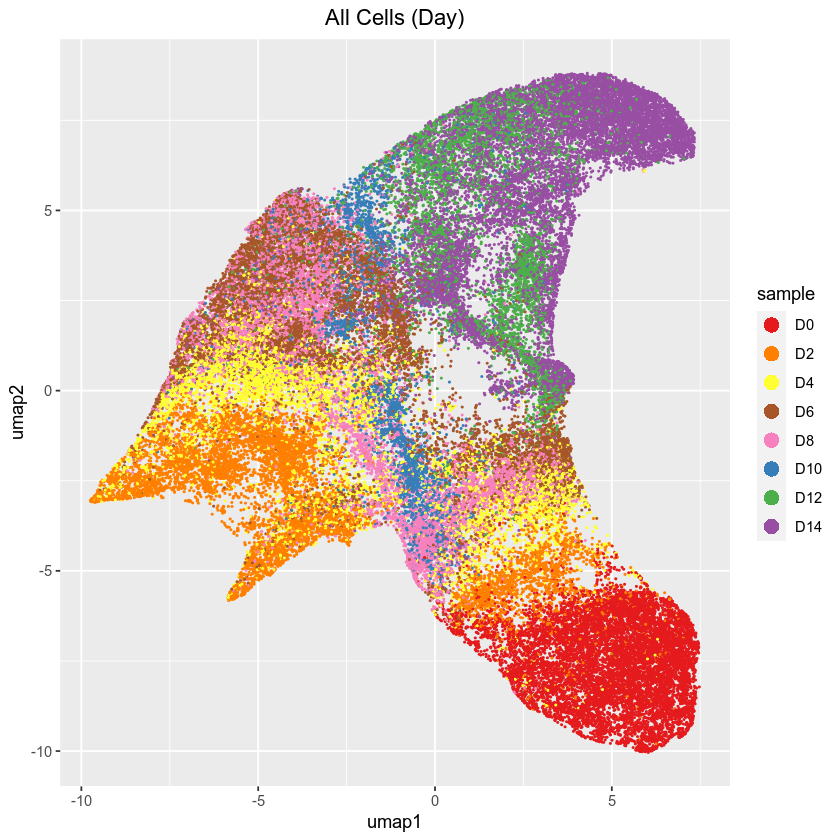

In [566]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2, 
                sample=metaData$sample)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=sample)) +
scale_color_brewer(breaks=DAYS, palette = "Set1") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5)) + 
guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Finer Clustering

In [329]:
library(RANN)
library(leiden)

In [330]:
feats = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/features.9d.tsv", header = T)
rownames(feats) = feats$sample_barcode
feats$sample_barcode = NULL
head(feats,3)

,X1,X2,X3,X4,X5,X6,X7,X8,X9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
D0_AAACAACGACGATTAC,0.008273414,-0.002722187,0.003893360,0.007244305,-0.0014696769,0.005695503,0.004268339,-0.006692450,-0.006633644
D0_AAACAACGAGCGCACT,0.008111355,-0.002690961,0.004064909,0.004544331,0.0001253377,0.006693920,0.005011271,-0.002917146,-0.004330547
D0_AAACACGCTACGCCAC,0.007594907,-0.002129955,0.003779752,0.005442017,-0.0004719591,0.005299541,0.002576238,-0.002178153,-0.001812286


In [331]:
K = 15

nn.ranked <- nn2(
        data = feats,
        k = K,
        searchtype = 'standard',
        eps = 0)$nn.idx;

j <- as.numeric(x = t(x = nn.ranked))
i <- ((1:length(x = j)) - 1) %/% K + 1
edgeList = data.frame(i, j, 1);
kmat = Matrix(0, nrow(feats), nrow(feats), sparse=TRUE);
kmat = sparseMatrix(i = edgeList[,1], j = edgeList[,2], x = edgeList[,3]);
nn_graph = SnapATAC:::newKgraph(mat=kmat, k=K, snn=FALSE, snn.prune=1/15);

In [426]:
clusters = leiden(SnapATAC:::getGraph(nn_graph), resolution=3)

In [427]:
table(clusters)

clusters
   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
2645 2427 2222 2205 2201 2118 2011 1939 1928 1892 1838 1746 1699 1693 1692 1665 
  17   18   19   20   21   22   23   24   25   26   27   28   29   30   31   32 
1654 1598 1461 1454 1450 1420 1396 1385 1372 1368 1366 1347 1315 1307 1290 1272 
  33   34   35   36   37   38   39   40   41   42   43   44   45   46   47 
1258 1224 1181 1161 1153 1139 1028  974  938  938  924  739  672  669  542 

In [494]:
# write fine clusters to file
# df = data.frame(sample_barcode=rownames(metaData), 
#                 clusters)
# write.table(df, "../20200206_pmat_snapATAC/sessions/20200520_n68916/fine_clusters.tsv", 
#             row.names = F, 
#             quote = F)

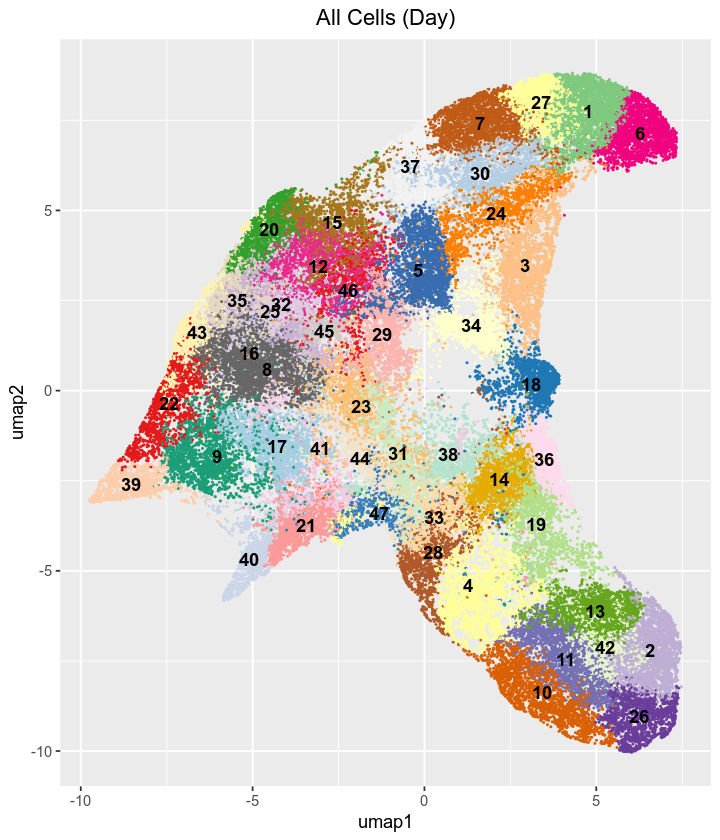

In [647]:
options(repr.plot.width = 6, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                clst=as.factor(clusters))
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=clst)) +
# scale_color_brewer( palette = "Set1") +
scale_color_manual(values=col_vector) +
geom_text(data=data.frame(aggregate(metaData[,c("umap1","umap2")], 
                                    list(clusters), mean)),
         aes(x=umap1, y=umap2, label=Group.1), fontface = "bold") +
ggtitle("All Cells (Day)") + 
theme(plot.title = element_text(hjust = 0.5),
      legend.positio = "none")
# guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Make pseudo-bulk matrix

In [567]:
agg_matrix = sparseMatrix(i=clusters,
                         j=seq(1,nrow(pmat)),
                         x=1L,
                         dims=c(length(table(clusters)), nrow(pmat)))

In [568]:
cts = as.matrix(agg_matrix %*% pmat)
colnames(cts) = sub("_", "-", sub("_", ":", rownames(regions)))
rownames(cts) = paste("cluster", seq(1,nrow(cts)), sep="_")
cts = t(cts)
head(cts)
dim(cts)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_38,cluster_39,cluster_40,cluster_41,cluster_42,cluster_43,cluster_44,cluster_45,cluster_46,cluster_47
chr1:97145604-97145864,2,32,30,25,18,4,5,41,39,74,⋯,23,5,9,16,12,6,20,9,15,8
chr1:7538148-7538363,9,68,35,51,6,4,9,68,34,143,⋯,34,5,8,23,20,3,23,37,20,22
chr1:93196678-93196894,1,42,2,7,0,1,2,9,11,20,⋯,3,7,0,2,2,0,2,5,0,0
chr1:187577713-187577913,1,25,4,0,0,0,0,18,2,16,⋯,4,2,1,0,2,6,2,8,1,0
chr1:53278065-53278265,6,21,7,4,2,1,3,21,13,15,⋯,10,1,5,21,7,7,7,6,10,5
chr1:177176832-177177032,0,2,2,1,3,1,0,47,31,1,⋯,0,28,0,0,1,71,2,7,1,0


[1] 803958     47

In [569]:
# removing smallest cluster since it has few cells and seem to be degenerate
# cts = cts[, 1:26]
# head(cts,2)

In [570]:
quantile(rowSums(cts), c(0, 0.02, 0.05,  0.1, 0.25, 0.5, 0.75, 0.9, 0.99, 1))

0%       2%       5%      10%      25%      50%      75%      90% 
   25.00    98.00   129.00   168.00   268.00   503.00  1166.00  2730.00 
     99%     100% 
10680.43 34300.00

In [571]:
sample(rownames(cts)[rowSums(cts)<quantile(rowSums(cts), 0.02)], 10)

[1] "chr20:29689925-29690125"  "chr16:10308701-10308901" 
 [3] "chr6:46105289-46105489"   "chr4:113020354-113020554"
 [5] "chr6:99762821-99763021"   "chr5:94325691-94325891"  
 [7] "chr15:74561469-74561669"  "chrX:24213962-24214162"  
 [9] "chr17:16619794-16619994"  "chr11:40105018-40105218"

In [572]:
cts = cts[rowSums(cts)>quantile(rowSums(cts), 0.05), ]
dim(cts)

[1] 763167     47

In [573]:
norm_cts = t(t(cts)/estimateSizeFactorsForMatrix(cts))

In [574]:
log_norm_cts = log2(1+norm_cts)

In [648]:
# cts_to_cluster = log_norm_cts 

# scale counts by width of bin
cts_to_cluster = log2(1+200*(norm_cts/width(GRanges(rownames(norm_cts)))))

# z norm
# cts_to_cluster = t(scale(t(cts_to_cluster)))

In [649]:
# ADD RAND SEED - not required
NUM_PEAK_SETS = 15
km_mb = MiniBatchKmeans(cts_to_cluster, 
                        batch_size = 1000,
                        clusters=NUM_PEAK_SETS,
                        num_init = 50, 
                        verbose = FALSE)

In [577]:
# reorder based on hierarchical clustering
# pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

# distance    = dist(t(scale(t(km_mb$centroids))))
# cluster     = hclust(distance, method="ward")
# dendrogram  = as.dendrogram(cluster)
# rowInd = rev(order.dendrogram(dendrogram))
# pr_mb = order(rowInd)[pr_mb]

In [650]:
# no hierarchical clustering, follow order of km_mb$centroids
pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

In [651]:
sort(table(pr_mb))

pr_mb
   13     5     7     1     4     2    10     8    11     3     6    14     9 
22536 30094 31687 39984 42717 53065 54298 54901 57749 57784 61135 61497 62936 
   12    15 
66083 66701 

In [652]:
order(rowVars(km_mb$centroids))

[1] 14  7 12 15  8 10 11  3  6  9  4  2  1 13  5

In [653]:
cts_clustered = cts_to_cluster[order(pr_mb),]
head(cts_clustered, 2)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_38,cluster_39,cluster_40,cluster_41,cluster_42,cluster_43,cluster_44,cluster_45,cluster_46,cluster_47
chr1:7538148-7538363,3.753708,4.786391,4.085900,5.834067,3.015204,2.865414,3.325292,4.395595,3.985541,5.885813,⋯,4.842487,2.864168,3.460371,4.402006,4.921201,2.197156,4.862901,4.586679,4.257813,5.530299
chr1:24046026-24046226,0.000000,5.309912,3.145854,5.233038,2.876675,1.427158,2.408618,3.669299,3.913771,4.960781,⋯,4.672735,3.185848,3.852245,4.165048,5.217556,2.617718,3.679855,3.776945,2.967037,4.222568


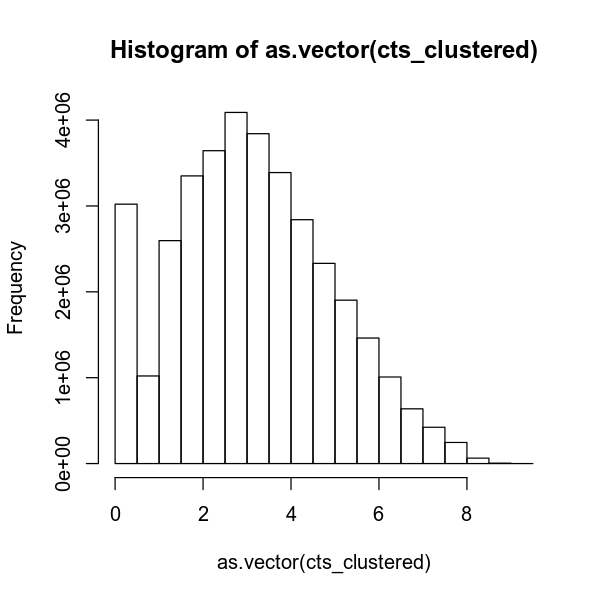

In [654]:
options(repr.plot.width = 5, repr.plot.height = 5)
hist(as.vector(cts_clustered))

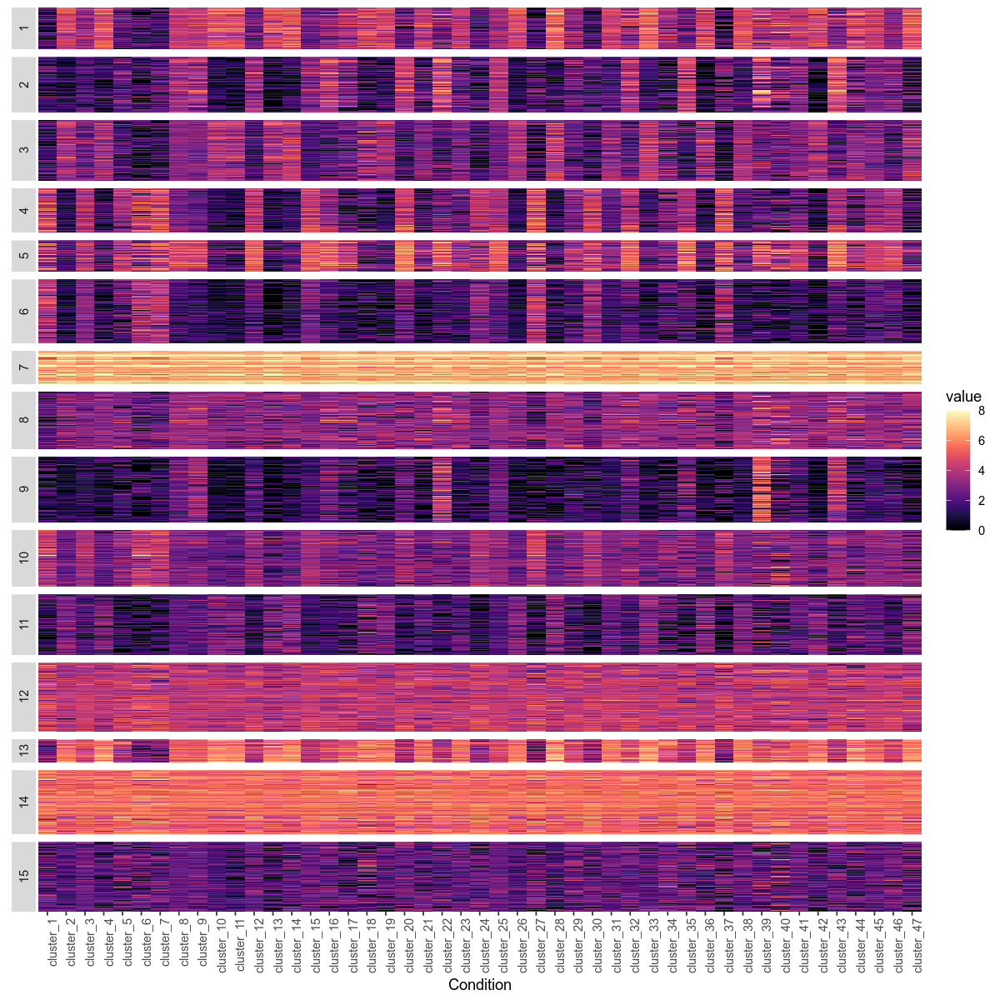

In [655]:
options(repr.plot.width = 10, repr.plot.height = 10)

idxs = seq(1, nrow(cts_clustered), 100) # if subsample
ggplot(data = melt(cts_clustered[idxs, ]), 
       mapping = aes(x = Var2,
                     y = Var1,
                     fill = value)) +
geom_tile()  + ylab(NULL) + xlab("Condition") +  
geom_raster(aes(fill=value)) +
scale_fill_viridis(limits=c(0, 8), oob=squish, option = "A") +
# scale_fill_viridis(option="A") + 
# scale_fill_gradient2(low="red", mid="black", high="blue") +
facet_grid(sort(pr_mb)[idxs] ~ ., switch = "y", scales = "free_y", space = "free_y")+
# theme_classic() +
theme(axis.text.x=element_text(angle=90,hjust=1),
      axis.text.y=element_blank(),
      axis.ticks.y=element_blank())
#       panel.spacing.y = unit(0.03, "cm"),
#       strip.text.y = element_text(size = 3))  
#       strip.background = element_rect(size = 0.1))

# ggsave(sprintf("figs/%s_heatmap_idr_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        dpi=1000)

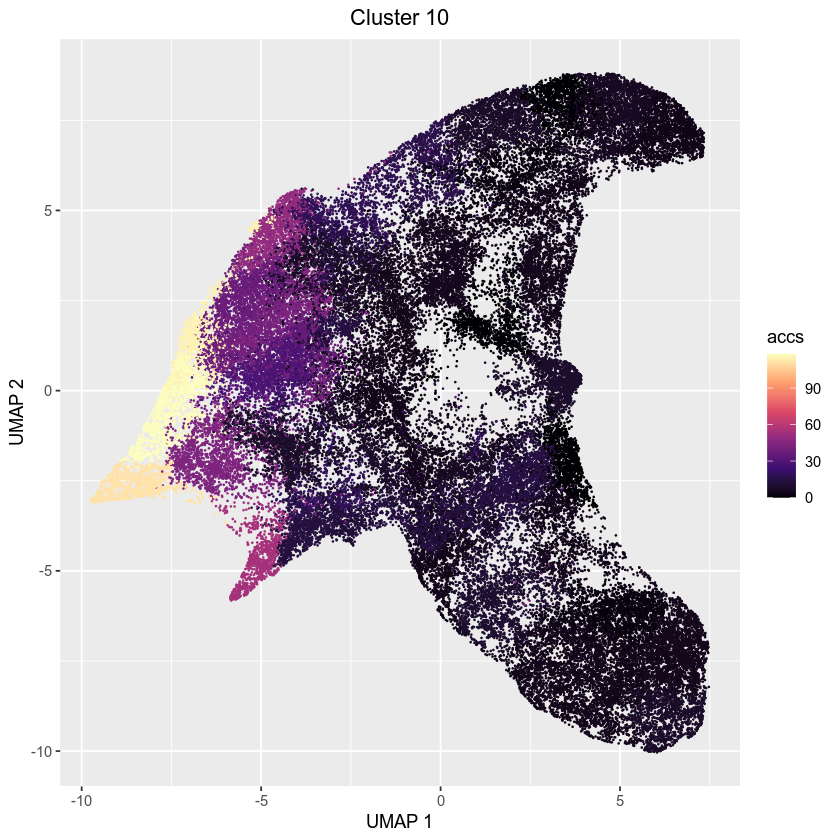

In [605]:
options(repr.plot.width = 7, repr.plot.height = 7)
selected_cluster_id = 10

# visualize a centroid
# df = data.frame(x.sp@umap, accs=km_mb$centroids[selected_cluster_id, ][clusters])

# or a specific peak
df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2, 
                accs=norm_cts["chr7:156823471-156823723", ][clusters])

# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=accs)) +
ggtitle(sprintf("Cluster %d", selected_cluster_id)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(#limits=c(0, 6),
                      oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5))

In [656]:
plots = list()
for (i in seq(1,NUM_PEAK_SETS)) {
    df = data.frame(umap1=metaData$umap1, 
                    umap2=metaData$umap2, 
                    centroid_accs=km_mb$centroids[i, ][clusters])
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1], 20000), ]
    
    plots[[i]] <- ggplot(df) +
    # ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
    geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=centroid_accs)) +
    ggtitle(sprintf("Cluster %d", i)) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits=c(0,7), oob=squish, option = "A") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
         legend.position = "none",
         axis.ticks = element_blank(),
         axis.text =element_blank(),
         axis.line=element_blank(),
         panel.border = element_rect(colour = "black", fill=NA, size=0.5))
}

In [657]:
# get legend
df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                centroid_accs=km_mb$centroids[1, ][clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1], 20000), ]

cur_plot <- ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=centroid_accs)) +
ggtitle(sprintf("Cluster %d", i)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(0, 7), oob=squish, option = "A") +
theme_classic() +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank(),
     axis.line=element_blank(),
     panel.border = element_rect(colour = "black", fill=NA, size=0.5))

legend_only = cowplot::get_legend(cur_plot)

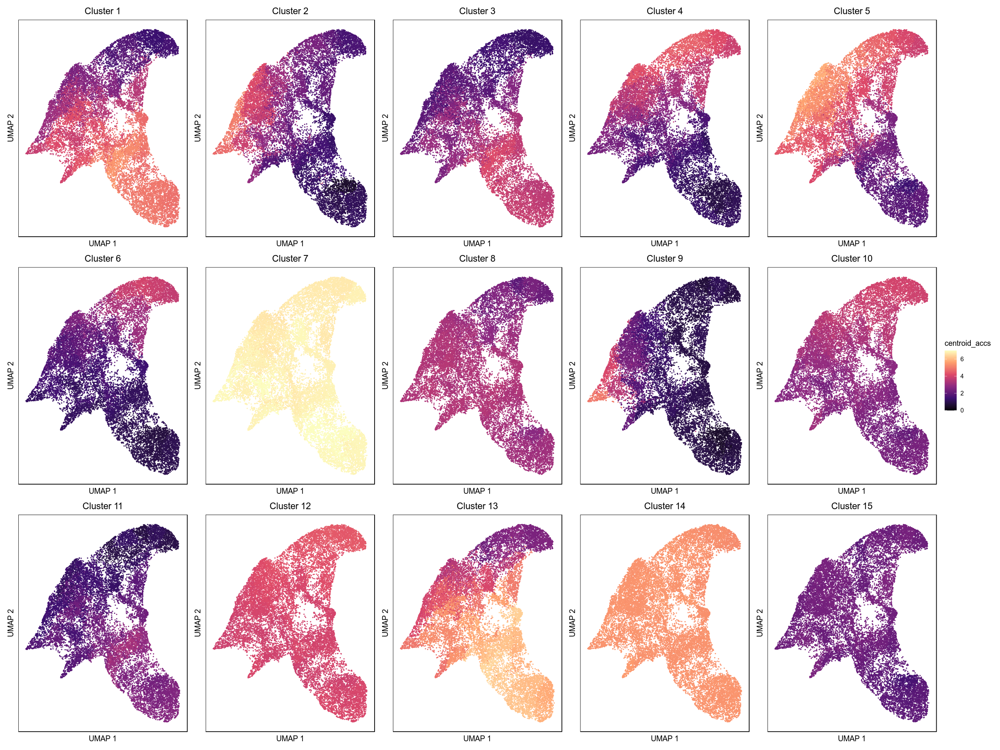

In [658]:
options(repr.plot.width = 20, repr.plot.height = 15)
wrap_plots(wrap_plots(plots, ncol = 5), legend_only, widths=c(0.95,0.05))  
# ggsave(sprintf("figs/%s_gridmap_peakwidthnorm_cluster_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        width=24, height=35, dpi=300)

## Writing BED files for Peak Sets

In [659]:
CLUSTER_IDX = 1
NORM = 'gridmap_peakwidthnorm'
BED_PATH = sprintf("beds/%s_%s_n%d/idx%d.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), CLUSTER_IDX)
# rownames(vsd_assay_to_cluster_normalized)[(which(pr_mb==CLUSTER_IDX))]
BED_PATH

[1] "beds/20200530_gridmap_peakwidthnorm_n15/idx1.bed"

In [660]:
peak_formatted = sub('-', '\t', sub(':', '\t', rownames(cts_to_cluster)))

In [661]:
for (i in seq(1,length(table(pr_mb)))){
BED_PATH = sprintf("beds/%s_%s_n%d/idx%d.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), i)
fileConn = file(BED_PATH)
writeLines(peak_formatted[(which(pr_mb==i))], fileConn)
close(fileConn)}

In [662]:
ALL_PEAKS_BED_PATH = sprintf("beds/%s_%s_n%d/all_peaks.bed", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)))
print(ALL_PEAKS_BED_PATH)
fileConn = file(ALL_PEAKS_BED_PATH)
writeLines(peak_formatted, fileConn)
close(fileConn)

[1] "beds/20200530_gridmap_peakwidthnorm_n15/all_peaks.bed"


## Fraction in Peak Plots

For each peak set, plot graphs similar to above but instead with fraction of reads in peak set for each single cell.

In [591]:
pmatRowSums = Matrix::rowSums(pmat)

In [665]:
peaks_gr = makeGRangesFromDataFrame(data.frame(chr=regions$chr,
                                   start=regions$bp1,
                                   end=regions$bp2))

In [666]:
plots = list()
for (i in seq(1,15)) {
    fname = sprintf("./beds/20200530_gridmap_peakwidthnorm_n15/idx%d.bed", i)
    region_gr = read.table(fname)

    colnames(region_gr) = c("chr", "start", "end")
    region_gr = makeGRangesFromDataFrame(region_gr)
    
    norm_reads_in_region = Matrix::rowSums(pmat[, unique(queryHits(findOverlaps(peaks_gr, region_gr)))])/pmatRowSums
    
    df = data.frame(umap1=metaData$umap1, 
                    umap2=metaData$umap2,
                    percent_reads=100*norm_reads_in_region)
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1], 30000), ]

    plots[[i]] = ggplot(df) +
    # ggplot(df[df$percent_reads<2, ]) +
    geom_point(size=0.1, alpha=1, aes(x=umap1 , y=umap2, col=percent_reads)) +
    ggtitle(sprintf("Peak Set %d \n (%d peaks)",  
                   i, length(region_gr))) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits= c(quantile(100*norm_reads_in_region, 0), 
                                  quantile(100*norm_reads_in_region, 0.99)), 
                          oob=squish, option = "B") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
         axis.ticks = element_blank(),
         axis.text =element_blank(),
         panel.border = element_rect(colour = "black", fill=NA, size=0.5))
}

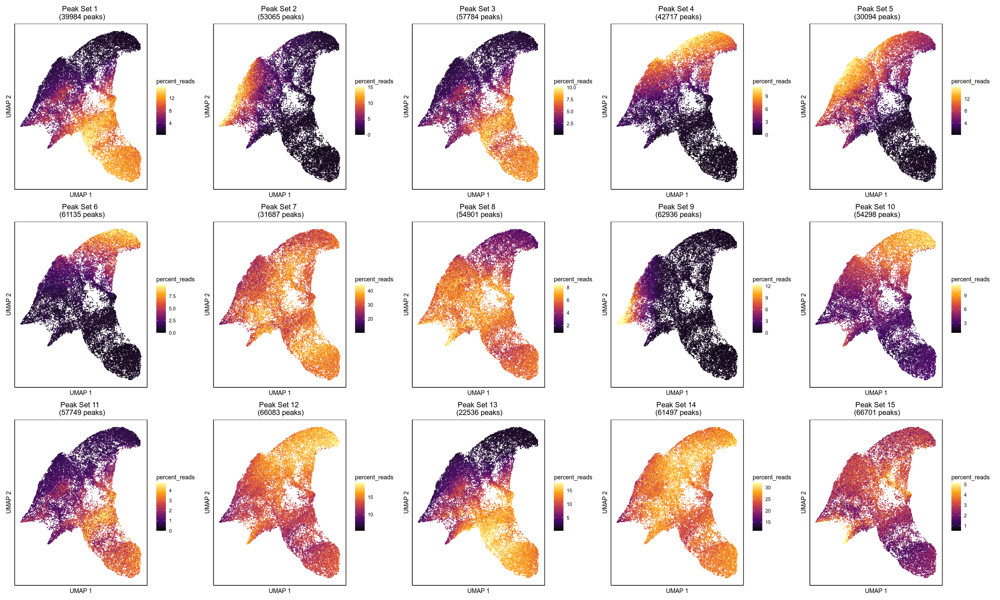

In [667]:
options(repr.plot.width = 25, repr.plot.height = 15)
wrap_plots(plots, ncol = 5) 
# ggsave(sprintf("figs/%s_gridmap_peakwidthnorm_sc_n%d.jpeg", format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        width=30, height=35, dpi=300)

In [99]:
# options(repr.plot.width = 25, repr.plot.height = 5)
# wrap_plots(list(plots[[5]], plots[[11]], plots[[20]], plots[[18]], plots[[19]]), ncol = 5)

In [100]:
# options(repr.plot.width = 25, repr.plot.height = 5)
# wrap_plots(list(plots[[13]], plots[[14]], plots[[17]], plots[[10]], plots[[16]]), ncol = 5)

In [101]:
# options(repr.plot.width = 15, repr.plot.height = 10)
# wrap_plots(list(plots[[2]], plots[[12]], plots[[9]], plots[[7]], plots[[1]], plots[[15]]), ncol = 3)

## GREAT Analysis

In [43]:
library(rGREAT)


------------------
Note: On Aug 19 2019 GREAT released version 4 where it supports `hg38`
genome and removes some ontologies such pathways. `submitGreatJob()`
still takes `hg19` as default. `hg38` can be specified by the `species
= 'hg38'` argument. To use the older versions such as 3.0.0, specify as
`submitGreatJob(..., version = '3.0.0')`.
------------------



In [96]:
peaks = read.table("beds/20200330_gridmap_peakwidthnorm_n20/idx1.bed")
colnames(peaks) = c("chr", "start", "end")
peaks = makeGRangesFromDataFrame(peaks)
peaks

GRanges object with 21314 ranges and 0 metadata columns:
          seqnames            ranges strand
             <Rle>         <IRanges>  <Rle>
      [1]     chr1       51689-52109      *
      [2]     chr1   2083154-2083354      *
      [3]     chr1   2148793-2149289      *
      [4]     chr1   2149338-2149538      *
      [5]     chr1   2802094-2802294      *
      ...      ...               ...    ...
  [21310]     chrY 20929733-20930029      *
  [21311]     chrY 20949541-20949741      *
  [21312]     chrY 20949820-20950020      *
  [21313]     chrY 21310322-21310522      *
  [21314]     chrY 22373656-22373856      *
  -------
  seqinfo: 24 sequences from an unspecified genome; no seqlengths

In [97]:
bg = read.table("beds/20200330_gridmap_peakwidthnorm_n20/all_peaks.bed")
colnames(bg) = c("chr", "start", "end")
bg = makeGRangesFromDataFrame(bg)
bg

GRanges object with 457477 ranges and 0 metadata columns:
           seqnames            ranges strand
              <Rle>         <IRanges>  <Rle>
       [1]     chr1       16147-16347      *
       [2]     chr1       51689-52109      *
       [3]     chr1     180686-181260      *
       [4]     chr1     181268-181597      *
       [5]     chr1     184385-184585      *
       ...      ...               ...    ...
  [457473]     chrY 21310322-21310522      *
  [457474]     chrY 22373656-22373856      *
  [457475]     chrY 26670497-26671505      *
  [457476]     chrY 56728041-56728241      *
  [457477]     chrY 56734685-56734895      *
  -------
  seqinfo: 24 sequences from an unspecified genome; no seqlengths

In [98]:
# if background does not contain peaks
bg = do.call("c", list(peaks, bg))

In [99]:
# job = submitGreatJob(peaks, species = "hg38", request_interval = 10)
job = submitGreatJob(peaks, bg=bg, species = "hg38", request_interval = 10)

In [100]:
job

Submit time: 2020-04-16 00:08:18 
Version: 4.0.4 
Species: hg38 
Inputs: 21314 regions
Background: user-defined, 478791 regions
Model: Basal plus extension 
  Proximal: 5 kb upstream, 1 kb downstream,
  plus Distal: up to 1000 kb
Include curated regulatory domains

Enrichment tables for following ontologies have been downloaded:
  None


In [101]:
tb = getEnrichmentTables(job)
names(tb)

[1] "GO Molecular Function" "GO Biological Process" "GO Cellular Component"

In [109]:
# head(tb[[2]][tb[[2]]$Hyper_Fold_Enrichment>1, c(1,2,3,4,6,13)], 30)
head(tb[[2]][(tb[[2]]$Hyper_Expected<5000)&(tb[[2]]$Hyper_Expected>50)&(tb[[2]]$Hyper_Fold_Enrichment>1), c(1,2,3,4,6,13)], 20)

# head(tb[[2]][(tb[[2]]$Binom_Expected<1000)&(tb[[2]]$Binom_Fold_Enrichment>2)&(tb[[2]]$Hyper_Adjp_BH<0.05)&(tb[[2]]$Binom_Adjp_BH<0.05), ], 30)
# head(tb[[2]], 30)

,ID,name,Hyper_Total_Regions,Hyper_Expected,Hyper_Fold_Enrichment,Hyper_Adjp_BH
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,GO:0007156,homophilic cell adhesion via plasma membrane adhesion molecules,10260,456.73720,1.834753,0.0000000000000000000000000000000000000000000000000000000002780973
2,GO:0099537,trans-synaptic signaling,22031,980.73840,1.525381,0.0000000000000000000000000000000000000000000000000000009384294794
3,GO:0098742,cell-cell adhesion via plasma-membrane adhesion molecules,15007,668.05600,1.627109,0.0000000000000000000000000000000000000000000000000043461268861000
4,GO:0007268,chemical synaptic transmission,21519,957.94610,1.507392,0.0000000000000000000000000000000000000000000000000362801854375000
5,GO:0050911,detection of chemical stimulus involved in sensory perception of smell,2024,90.10098,2.719171,0.0000000000000000000000000000000000000000693997501420000043387983
6,GO:0007416,synapse assembly,6692,297.90300,1.785816,0.0000000000000000000000000000000013868585915999999970603574848692
7,GO:0050907,detection of chemical stimulus involved in sensory perception,2893,128.78560,2.174156,0.0000000000000000000000000000109756110186250004815208219288677602
8,GO:0007608,sensory perception of smell,3422,152.33480,2.067814,0.0000000000000000000000000000109756110186250004815208219288677602
10,GO:0071625,vocalization behavior,1286,57.24795,2.707520,0.0000000000000000000000002501648278700000382441873936598868831448


## Misc: Colour with Old Clusters

Clusters from  SnapATAC.ipynb

In [418]:
# using old metadata to annotate (these clusters were used to call peaks)

# Metadata file from previous run
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
old_metaData = read.table("../20200122_snapATAC/snapATAC_sessions/20200518_n76052/metadata.tsv", header = T)
rownames(old_metaData) =  paste(old_metaData$sample, old_metaData$barcode, sep='_')
old_metaData = old_metaData[rownames(metaData), ]
head(old_metaData, 2)

,barcode,TN,UM,PP,UQ,CM,landmark,cluster,umap1,umap2,sample
,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<fct>
D0_AAACAACGACGATTAC,AAACAACGACGATTAC,53446,53446,53446,53379,0,0,5,-9.141595,0.4763734,D0
D0_AAACAACGAGCGCACT,AAACAACGAGCGCACT,27136,27136,27136,27120,0,0,5,-9.158141,-0.2551545,D0


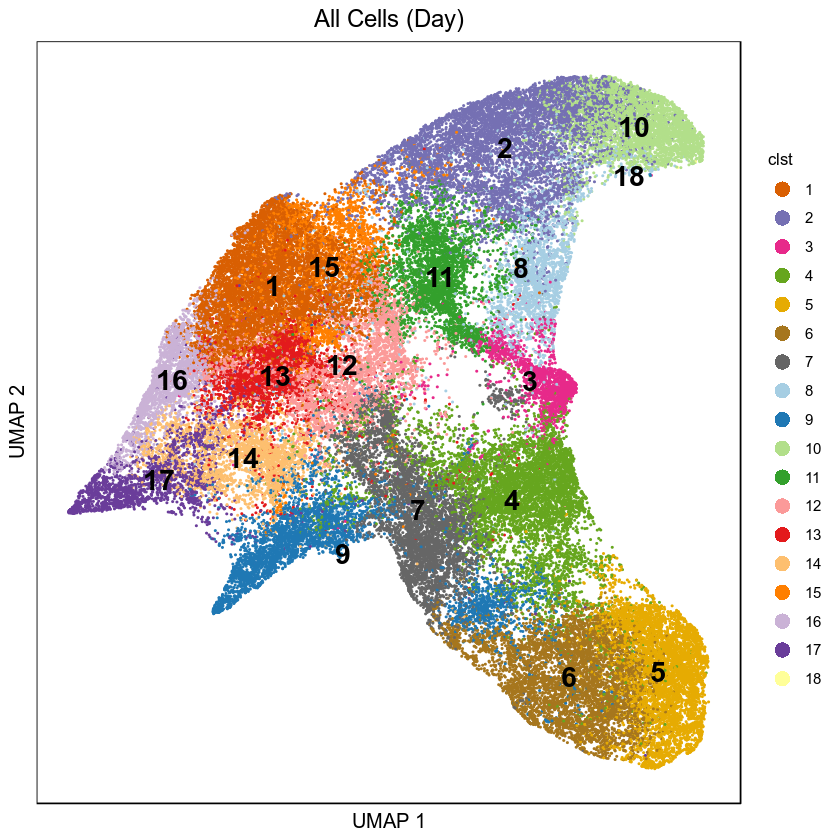

In [606]:
options(repr.plot.width = 7, repr.plot.height = 7)

df = data.frame(umap1=metaData$umap1, 
                umap2=metaData$umap2,
                clst=as.factor(old_metaData$cluster))
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1,
                                  y=umap2,
                                  col=clst)) +
# scale_color_brewer( palette = "Set1") +
scale_color_manual(values=col_vector[10:length(col_vector)]) +
geom_text(data=data.frame(aggregate(metaData[,c("umap1", "umap2")],
                                    list(old_metaData$cluster), mean)),
         aes(x=umap1, y=umap2, label=Group.1), size=6, fontface = "bold") +
ggtitle("All Cells (Day)") + 
xlab("UMAP 1")  + ylab("UMAP 2") +
 theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
          text = element_text(size=12),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          legend.title=element_text(size=10), 
          legend.text=element_text(size=9),
          panel.border = element_rect(colour = "black", fill=NA, size=0.5))  +
#       legend.positio = "none")
guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 